# <font color='#EADCA0'><h2>Data Downloading from Kaggle</font>
After downloading the datasets from Kaggle, the code uses a function to unzip the datasets for further use in the model.
<br>
steps to download kaggle.json





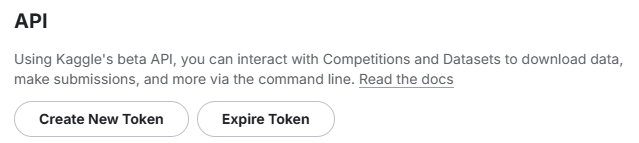

In [ ]:
!pip install kaggle

In [ ]:
from google.colab import files
files.upload()  # Upload kaggle.json file

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"fatmaalzhraahmed","key":"3eed64e21ca24f20e09f62453619f9d4"}'}

In [ ]:
import os
os.makedirs('/root/.kaggle', exist_ok=True)
!mv kaggle.json /root/.kaggle/

In [ ]:
!kaggle datasets download -d fatmaalzhraahmed/virus-12345

Dataset URL: https://www.kaggle.com/datasets/fatmaalzhraahmed/virus-12345
License(s): unknown
100% 4.70G/4.71G [01:01<00:00, 125MB/s]
100% 4.71G/4.71G [01:02<00:00, 81.2MB/s]


In [ ]:
!unzip virus-12345.zip -d virus

Streaming output truncated to the last 5000 lines.
  inflating: virus/TEM virus dataset/context_virus_1nm_256x256/validation/Marburg/3_31.tif  
  inflating: virus/TEM virus dataset/context_virus_1nm_256x256/validation/Marburg/3_32.tif  
  inflating: virus/TEM virus dataset/context_virus_1nm_256x256/validation/Marburg/3_33.tif  
  inflating: virus/TEM virus dataset/context_virus_1nm_256x256/validation/Marburg/3_34.tif  
  inflating: virus/TEM virus dataset/context_virus_1nm_256x256/validation/Marburg/3_35.tif  
  inflating: virus/TEM virus dataset/context_virus_1nm_256x256/validation/Marburg/3_36.tif  
  inflating: virus/TEM virus dataset/context_virus_1nm_256x256/validation/Marburg/3_37.tif  
  inflating: virus/TEM virus dataset/context_virus_1nm_256x256/validation/Marburg/3_38.tif  
  inflating: virus/TEM virus dataset/context_virus_1nm_256x256/validation/Marburg/3_4.tif  
  inflating: virus/TEM virus dataset/context_virus_1nm_256x256/validation/Marburg/3_5.tif  
  inflating: virus/TE

# <font color='#EADCA0'><h2>IMPORT NECESSARY LIBRARIES</font>

In [ ]:
import cv2
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import clear_output
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, recall_score
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import layers
from tensorflow.keras import Model, Sequential, models
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers, Model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.models import Model

# <font color='#EADCA0'><h2>VISUALIZE IMAGE DATA</font>

<font color='#EADCA1'><h3>COUNT IMAGES IN EACH CLASS</h3></font>

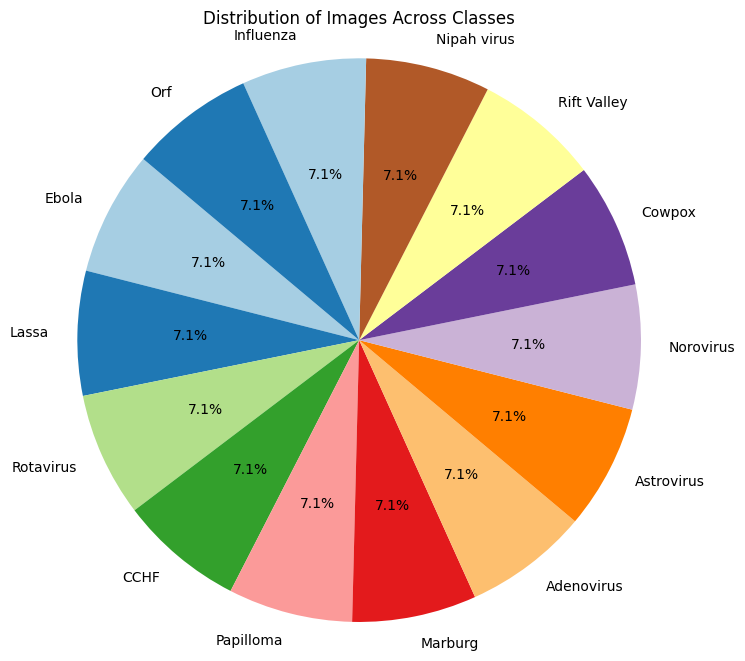

In [ ]:
def count_images_in_classes(input_folder):
    class_image_counts = {}

    for class_folder in os.listdir(input_folder):
        class_path = os.path.join(input_folder, class_folder)

        if os.path.isdir(class_path):
            tif_files = [f for f in os.listdir(class_path) if f.endswith(".tif")]

            class_image_counts[class_folder] = len(tif_files)

    return class_image_counts

# create a pie chart
def plot_pie_chart(image_counts):
    # Prepare data for pie chart
    class_names = list(image_counts.keys())
    image_counts_values = list(image_counts.values())

    plt.figure(figsize=(8, 8))
    plt.pie(image_counts_values, labels=class_names, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
    plt.title('Distribution of Images Across Classes')
    plt.axis('equal')
    plt.show()

input_folder = "/content/virus/TEM virus dataset/context_virus_1nm_256x256/augmented_train"

image_counts = count_images_in_classes(input_folder)

plot_pie_chart(image_counts)


<font color='#EADCA0'><h3>COUNT TRAIN IMAGE DATA</h3></font>

In [ ]:
print("Number of images per class:")
for class_name, count in image_counts.items():
    print(f"{class_name}: {count} images")

total_images = sum(image_counts.values())
print(f"\nTotal number of images: {total_images}")

Number of images per class:
Rotavirus: 736 images
Rift Valley: 736 images
Marburg: 736 images
Nipah virus: 736 images
Papilloma: 736 images
Orf: 736 images
Adenovirus: 736 images
Influenza: 736 images
Norovirus: 736 images
CCHF: 736 images
Lassa: 736 images
Astrovirus: 736 images
Cowpox: 736 images
Ebola: 736 images

Total number of images: 10304


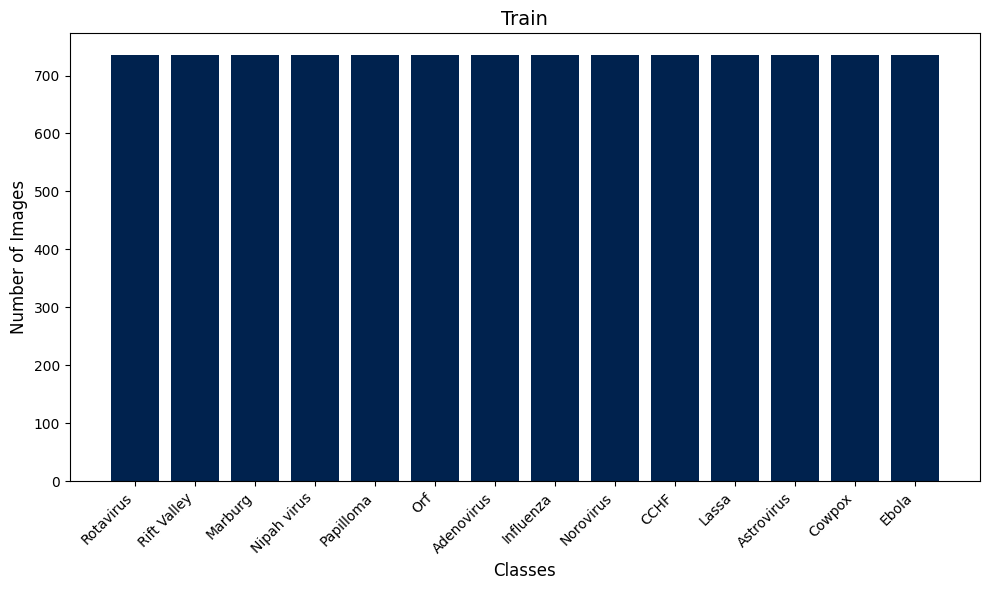

In [ ]:
def plot_bar_chart(image_counts):
    sorted_classes = sorted(image_counts.items(), key=lambda x: x[1], reverse=True)

    class_names, image_counts_values = zip(*sorted_classes)

    cmap = plt.cm.cividis
    norm = plt.Normalize(vmin=min(image_counts_values), vmax=max(image_counts_values))

    plt.figure(figsize=(10, 6))
    bars = plt.bar(class_names, image_counts_values, color=cmap(norm(image_counts_values)))

    plt.title('Train', fontsize=14)
    plt.xlabel('Classes', fontsize=12)
    plt.ylabel('Number of Images', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

input_folder = "/content/virus/TEM virus dataset/context_virus_1nm_256x256/augmented_train"

image_counts = count_images_in_classes(input_folder)

plot_bar_chart(image_counts)

<font color='#EADCA0'><h2>IMAGE PREPROCESSING AND HISTOGRAM</h2></font>
##### <font color='#E1CD76'>Step 1: Apply Histogram Equalization</font>
##### <font color='#E1CD76'> Step 2: Apply smoothing (Gaussian Blur)</font>
##### <font color='#E1CD76'> Step 3: Compute the histogram after preprocessing</font>
##### <font color='#E1CD76'> Step 4: Display the histogram </font>
##### <font color='#E1CD76'> Step 5: Apply histogram-based segmentation :Use Otsu's method to find the threshold </font>
##### <font color='#E1CD76'> Step 6: Visualize results</font>


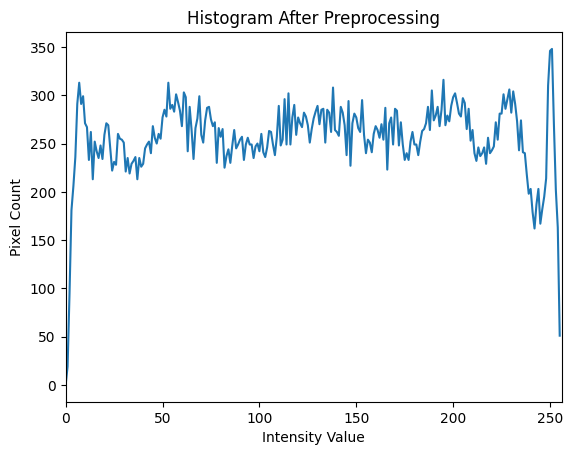

Threshold value (Otsu's method): 127.0


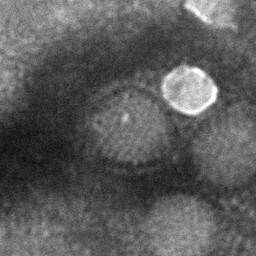

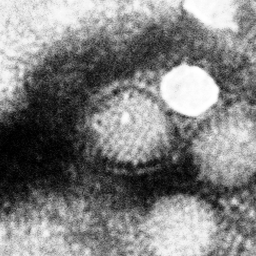

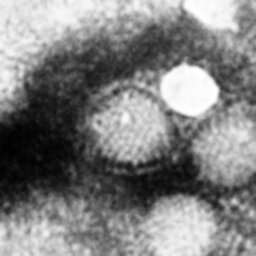

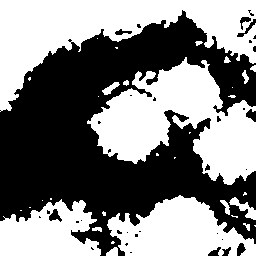

In [ ]:
image = cv2.imread('/content/virus/TEM virus dataset/context_virus_1nm_256x256/validation/Adenovirus/10_1.tif', cv2.IMREAD_GRAYSCALE)  # Load as grayscale

equalized_image = cv2.equalizeHist(image)

smoothed_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)  # (5, 5) is the kernel size

hist = cv2.calcHist([smoothed_image], [0], None, [256], [0, 256])

plt.figure()
plt.title("Histogram After Preprocessing")
plt.xlabel("Intensity Value")
plt.ylabel("Pixel Count")
plt.plot(hist)
plt.xlim([0, 256])
plt.show()

_, segmented_image = cv2.threshold(smoothed_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f"Threshold value (Otsu's method): {_}")

cv2_imshow(image)
cv2_imshow(equalized_image)
cv2_imshow(smoothed_image)
cv2_imshow(segmented_image)


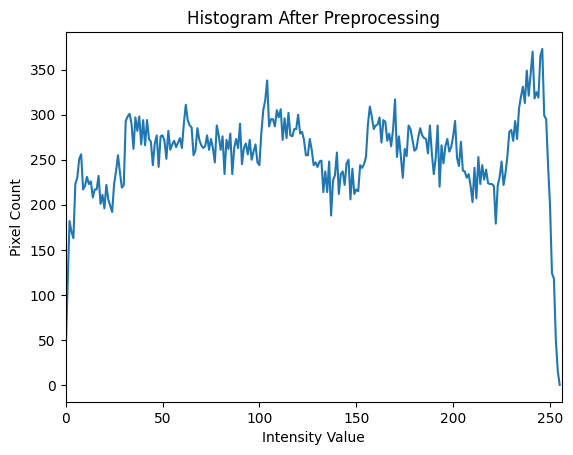

Threshold value (Otsu's method): 130.0


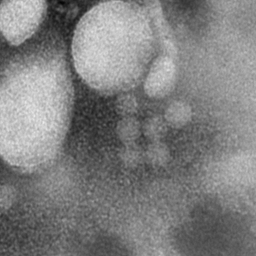

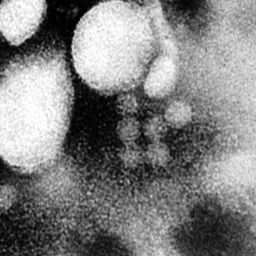

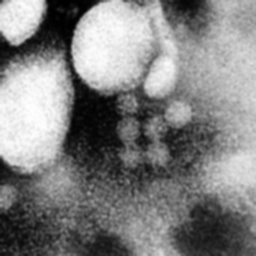

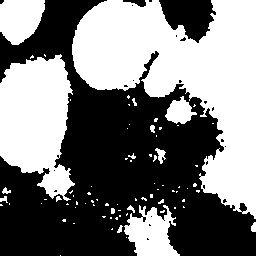

In [ ]:
image = cv2.imread('/content/virus/TEM virus dataset/context_virus_1nm_256x256/validation/Astrovirus/10_1.tif', cv2.IMREAD_GRAYSCALE)  # Load as grayscale

equalized_image = cv2.equalizeHist(image)

smoothed_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)

hist = cv2.calcHist([smoothed_image], [0], None, [256], [0, 256])

plt.figure()
plt.title("Histogram After Preprocessing")
plt.xlabel("Intensity Value")
plt.ylabel("Pixel Count")
plt.plot(hist)
plt.xlim([0, 256])
plt.show()


_, segmented_image = cv2.threshold(smoothed_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f"Threshold value (Otsu's method): {_}")


cv2_imshow(image)
cv2_imshow(equalized_image)
cv2_imshow(smoothed_image)
cv2_imshow(segmented_image)


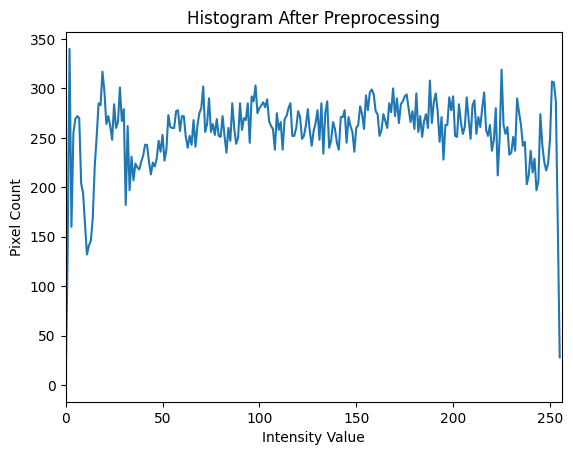

Threshold value (Otsu's method): 128.0


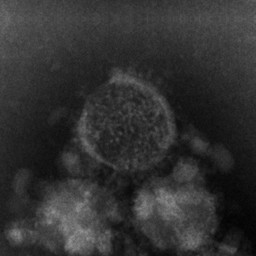

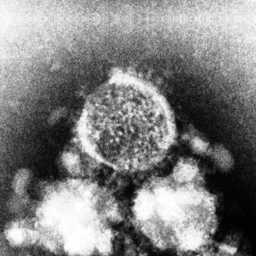

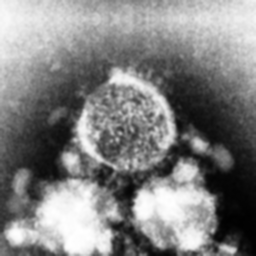

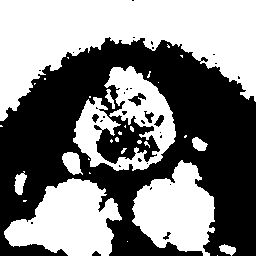

In [ ]:
image = cv2.imread('/content/virus/TEM virus dataset/context_virus_1nm_256x256/validation/CCHF/10_1.tif', cv2.IMREAD_GRAYSCALE)

equalized_image = cv2.equalizeHist(image)

smoothed_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)

hist = cv2.calcHist([smoothed_image], [0], None, [256], [0, 256])

plt.figure()
plt.title("Histogram After Preprocessing")
plt.xlabel("Intensity Value")
plt.ylabel("Pixel Count")
plt.plot(hist)
plt.xlim([0, 256])
plt.show()


_, segmented_image = cv2.threshold(smoothed_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f"Threshold value (Otsu's method): {_}")

cv2_imshow(image)
cv2_imshow(equalized_image)
cv2_imshow(smoothed_image)
cv2_imshow(segmented_image)


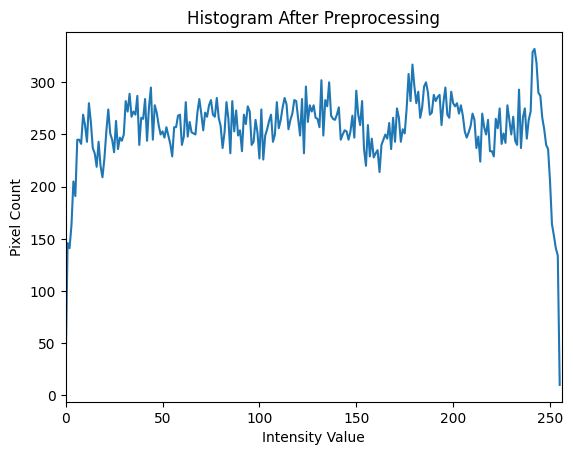

Threshold value (Otsu's method): 128.0


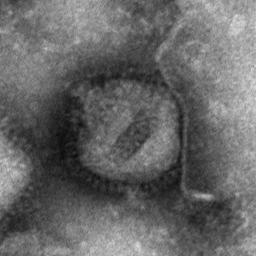

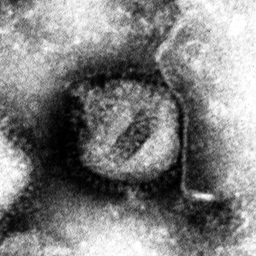

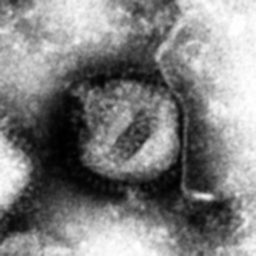

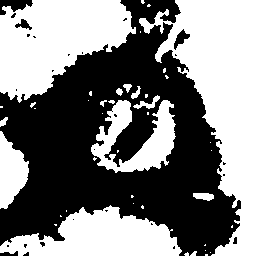

In [ ]:
image = cv2.imread('/content/virus/TEM virus dataset/context_virus_1nm_256x256/validation/Influenza/10_2.tif', cv2.IMREAD_GRAYSCALE)
equalized_image = cv2.equalizeHist(image)

smoothed_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)

hist = cv2.calcHist([smoothed_image], [0], None, [256], [0, 256])

plt.figure()
plt.title("Histogram After Preprocessing")
plt.xlabel("Intensity Value")
plt.ylabel("Pixel Count")
plt.plot(hist)
plt.xlim([0, 256])
plt.show()


_, segmented_image = cv2.threshold(smoothed_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f"Threshold value (Otsu's method): {_}")

cv2_imshow(image)
cv2_imshow(equalized_image)
cv2_imshow(smoothed_image)
cv2_imshow(segmented_image)


<font color='#EADCA0'><h2>Steps for Balancing Data</h2></font>
###### <font color='#E1CD76'>
1.Shuffle and Resample: We can shuffle the data and resample the classes to either oversample the underrepresented classes or undersample the overrepresented ones.
</font>
###### <font color='#E1CD76'>
2.Stratified Splitting: This ensures that the proportion of each class in the training, validation, and test sets is kept consistent.
</font>



In [ ]:
source_folder = "/content/virus/TEM virus dataset/context_virus_1nm_256x256/augmented_train"
destination_folder = "/content/all"

shutil.copytree(source_folder, destination_folder)

print(f"Folder copied from {source_folder} to {destination_folder}")


Folder copied from /content/virus/TEM virus dataset/context_virus_1nm_256x256/augmented_train to /content/all


In [ ]:
source_folder = "/content/virus/TEM virus dataset/context_virus_1nm_256x256/validation"
destination_folder = "/content/all"

for item in os.listdir(source_folder):
    source_item = os.path.join(source_folder, item)
    destination_item = os.path.join(destination_folder, item)

    if os.path.isdir(source_item):
        shutil.copytree(source_item, destination_item, dirs_exist_ok=True)
    else:
        shutil.copy2(source_item, destination_item)

print(f"Files have been copied from {source_folder} to {destination_folder}")


Files have been copied from /content/virus/TEM virus dataset/context_virus_1nm_256x256/validation to /content/all


In [ ]:
source_folder = "/content/virus/TEM virus dataset/context_virus_1nm_256x256/test"
destination_folder = "/content/all"

for item in os.listdir(source_folder):
    source_item = os.path.join(source_folder, item)
    destination_item = os.path.join(destination_folder, item)

    if os.path.isdir(source_item):
        shutil.copytree(source_item, destination_item, dirs_exist_ok=True)
    else:
        shutil.copy2(source_item, destination_item)

print(f"Files have been copied from {source_folder} to {destination_folder}")


Files have been copied from /content/virus/TEM virus dataset/context_virus_1nm_256x256/test to /content/all


In [ ]:
source_folder = "/content/virus/TEM virus dataset/context_virus_1nm_256x256/train"
destination_folder = "/content/all"

for item in os.listdir(source_folder):
    source_item = os.path.join(source_folder, item)
    destination_item = os.path.join(destination_folder, item)

    if os.path.isdir(source_item):
        shutil.copytree(source_item, destination_item, dirs_exist_ok=True)
    else:
        shutil.copy2(source_item, destination_item)

print(f"Files have been copied from {source_folder} to {destination_folder}")


Files have been copied from /content/virus/TEM virus dataset/context_virus_1nm_256x256/train to /content/all


In [ ]:
source_folder = "/content/virus/TEM virus dataset/context_virus_RAW/test"
destination_folder = "/content/all"

folders_to_copy = [
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]

os.makedirs(destination_folder, exist_ok=True)

for folder_name in folders_to_copy:
    source_item = os.path.join(source_folder, folder_name)
    destination_item = os.path.join(destination_folder, folder_name)

    if os.path.exists(source_item):
        os.makedirs(destination_item, exist_ok=True)
        for item in os.listdir(source_item):
            source_path = os.path.join(source_item, item)
            destination_path = os.path.join(destination_item, item)

            if os.path.isdir(source_path):
                shutil.copytree(source_path, destination_path, dirs_exist_ok=True)
            else:
                shutil.copy2(source_path, destination_path)

        print(f"Copied: {folder_name} to {destination_item}")
    else:
        print(f"Folder not found: {folder_name}")

print(f"Selected folders have been copied to {destination_folder}")


Copied: Rotavirus to /content/all/Rotavirus
Copied: Papilloma to /content/all/Papilloma
Copied: Influenza to /content/all/Influenza
Copied: Adenovirus to /content/all/Adenovirus
Copied: Lassa to /content/all/Lassa
Copied: Orf to /content/all/Orf
Copied: CCHF to /content/all/CCHF
Copied: Astrovirus to /content/all/Astrovirus
Copied: Cowpox to /content/all/Cowpox
Copied: Norovirus to /content/all/Norovirus
Copied: Nipah virus to /content/all/Nipah virus
Copied: Marburg to /content/all/Marburg
Copied: Rift Valley to /content/all/Rift Valley
Copied: Ebola to /content/all/Ebola
Selected folders have been copied to /content/all


In [ ]:
source_folder = "/content/virus/TEM virus dataset/context_virus_RAW/train"
destination_folder = "/content/all"

folders_to_copy = [
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]

os.makedirs(destination_folder, exist_ok=True)

for folder_name in folders_to_copy:
    source_item = os.path.join(source_folder, folder_name)
    destination_item = os.path.join(destination_folder, folder_name)

    if os.path.exists(source_item):
        os.makedirs(destination_item, exist_ok=True)
        for item in os.listdir(source_item):
            source_path = os.path.join(source_item, item)
            destination_path = os.path.join(destination_item, item)

            if os.path.isdir(source_path):
                shutil.copytree(source_path, destination_path, dirs_exist_ok=True)
            else:
                shutil.copy2(source_path, destination_path)

        print(f"Copied: {folder_name} to {destination_item}")
    else:
        print(f"Folder not found: {folder_name}")

print(f"Selected folders have been copied to {destination_folder}")


Copied: Rotavirus to /content/all/Rotavirus
Copied: Papilloma to /content/all/Papilloma
Copied: Influenza to /content/all/Influenza
Copied: Adenovirus to /content/all/Adenovirus
Copied: Lassa to /content/all/Lassa
Copied: Orf to /content/all/Orf
Copied: CCHF to /content/all/CCHF
Copied: Astrovirus to /content/all/Astrovirus
Copied: Cowpox to /content/all/Cowpox
Copied: Norovirus to /content/all/Norovirus
Copied: Nipah virus to /content/all/Nipah virus
Copied: Marburg to /content/all/Marburg
Copied: Rift Valley to /content/all/Rift Valley
Copied: Ebola to /content/all/Ebola
Selected folders have been copied to /content/all


In [ ]:
source_folder = "/content/virus/TEM virus dataset/context_virus_RAW/validation"
destination_folder = "/content/all"

folders_to_copy = [
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]

os.makedirs(destination_folder, exist_ok=True)

for folder_name in folders_to_copy:
    source_item = os.path.join(source_folder, folder_name)
    destination_item = os.path.join(destination_folder, folder_name)

    if os.path.exists(source_item):
        os.makedirs(destination_item, exist_ok=True)
        for item in os.listdir(source_item):
            source_path = os.path.join(source_item, item)
            destination_path = os.path.join(destination_item, item)

            if os.path.isdir(source_path):
                shutil.copytree(source_path, destination_path, dirs_exist_ok=True)
            else:
                shutil.copy2(source_path, destination_path)

        print(f"Copied: {folder_name} to {destination_item}")
    else:
        print(f"Folder not found: {folder_name}")

print(f"Selected folders have been copied to {destination_folder}")


Copied: Rotavirus to /content/all/Rotavirus
Copied: Papilloma to /content/all/Papilloma
Copied: Influenza to /content/all/Influenza
Copied: Adenovirus to /content/all/Adenovirus
Copied: Lassa to /content/all/Lassa
Copied: Orf to /content/all/Orf
Copied: CCHF to /content/all/CCHF
Copied: Astrovirus to /content/all/Astrovirus
Copied: Cowpox to /content/all/Cowpox
Copied: Norovirus to /content/all/Norovirus
Copied: Nipah virus to /content/all/Nipah virus
Copied: Marburg to /content/all/Marburg
Copied: Rift Valley to /content/all/Rift Valley
Copied: Ebola to /content/all/Ebola
Selected folders have been copied to /content/all


In [ ]:
folder_path = "/content/all/_EXCLUDED"

if os.path.exists(folder_path):
    shutil.rmtree(folder_path)
    print(f"Folder '{folder_path}' and all its contents have been removed.")
else:
    print(f"Folder '{folder_path}' does not exist.")


Folder '/content/all/_EXCLUDED' and all its contents have been removed.


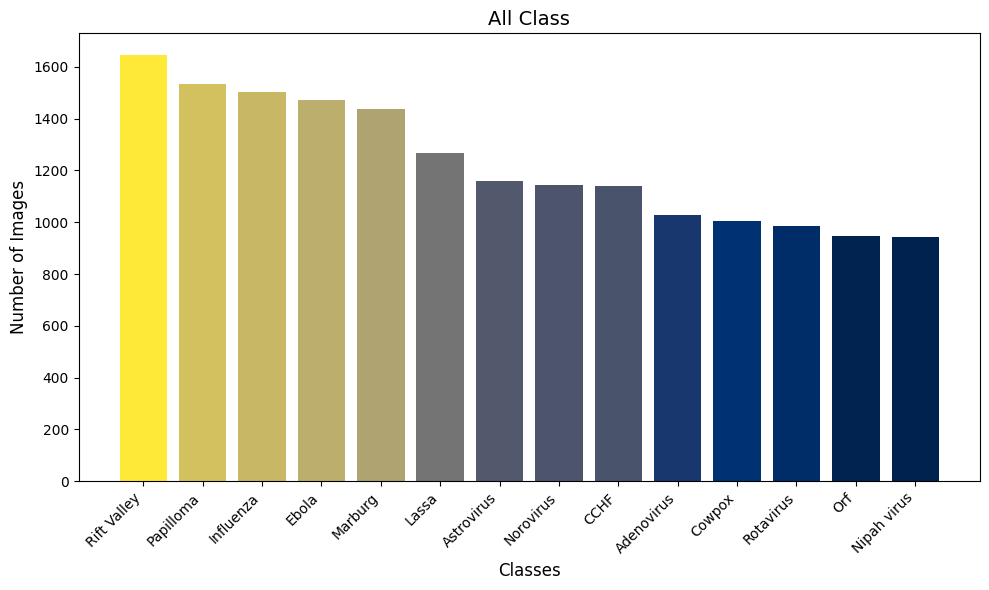

In [ ]:
def plot_bar_chart(image_counts):
    sorted_classes = sorted(image_counts.items(), key=lambda x: x[1], reverse=True)

    class_names, image_counts_values = zip(*sorted_classes)

    cmap = plt.cm.cividis
    norm = plt.Normalize(vmin=min(image_counts_values), vmax=max(image_counts_values))

    plt.figure(figsize=(10, 6))
    bars = plt.bar(class_names, image_counts_values, color=cmap(norm(image_counts_values)))

    plt.title('All Class', fontsize=14)
    plt.xlabel('Classes', fontsize=12)
    plt.ylabel('Number of Images', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

input_folder = "/content/all"

image_counts = count_images_in_classes(input_folder)
plot_bar_chart(image_counts)

<font color='#EADCA0'><h2>RESPLITING DATASET INTO TRAIN, VALIDATION, AND TEST SETS</h2></font>
###### <font color='#E1CD76'>Split the data (60% train, 20% val, 20% test)</font>


In [ ]:
output_dir = '/content/all'

class_names = [
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]

for class_name in class_names:
    class_dir = os.path.join(output_dir, class_name)

    if os.path.exists(class_dir):
        num_images = len(os.listdir(class_dir))
        print(f"{class_name}: {num_images} images")
    else:
        print(f"Directory not found: {class_dir}")


Rotavirus: 988 images
Papilloma: 1537 images
Influenza: 1507 images
Adenovirus: 1032 images
Lassa: 1271 images
Orf: 950 images
CCHF: 1143 images
Astrovirus: 1163 images
Cowpox: 1008 images
Norovirus: 1147 images
Nipah virus: 945 images
Marburg: 1442 images
Rift Valley: 1650 images
Ebola: 1476 images


In [ ]:
base_dir = '/content/all'
train_dir = '/content/process/train'
val_dir = '/content/process/val'
test_dir = '/content/process/test'

class_names = [
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]

random_state = 58
random.seed(random_state)

os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

for class_name in class_names:
    class_dir = os.path.join(base_dir, class_name)

    os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(val_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)

    images = [f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))]
    random.shuffle(images)
    num_images = len(images)
    train_size = int(0.6 * num_images)
    val_size = int(0.2 * num_images)

    train_images = images[:train_size]
    val_images = images[train_size:train_size + val_size]
    test_images = images[train_size + val_size:]

    # Move images to class directories
    for img_name in train_images:
        shutil.copy(os.path.join(class_dir, img_name), os.path.join(train_dir, class_name, img_name))
    for img_name in val_images:
        shutil.copy(os.path.join(class_dir, img_name), os.path.join(val_dir, class_name, img_name))
    for img_name in test_images:
        shutil.copy(os.path.join(class_dir, img_name), os.path.join(test_dir, class_name, img_name))



<ipython-input-50-ca316e48e50c>:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='class', y='count', data=sorted_df, palette='viridis')  # Create the bar plot


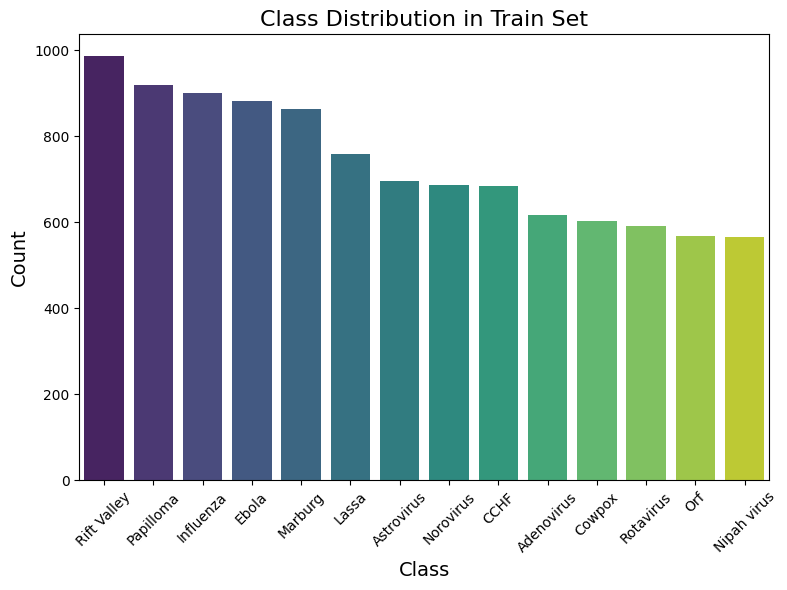

In [ ]:
train_dir = '/content/process/train'

categories =[
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]


train_labels = []

for category in categories:
    category_path = os.path.join(train_dir, category)
    num_files = len(os.listdir(category_path))

    train_labels += [category] * num_files

df = pd.DataFrame({'class': train_labels})

class_counts = df['class'].value_counts().sort_values(ascending=False)

sorted_df = pd.DataFrame({'class': class_counts.index, 'count': class_counts.values})

plt.figure(figsize=(8, 6))
sns.barplot(x='class', y='count', data=sorted_df, palette='viridis')
plt.title('Class Distribution in Train Set', fontsize=16)
plt.xlabel('Class', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


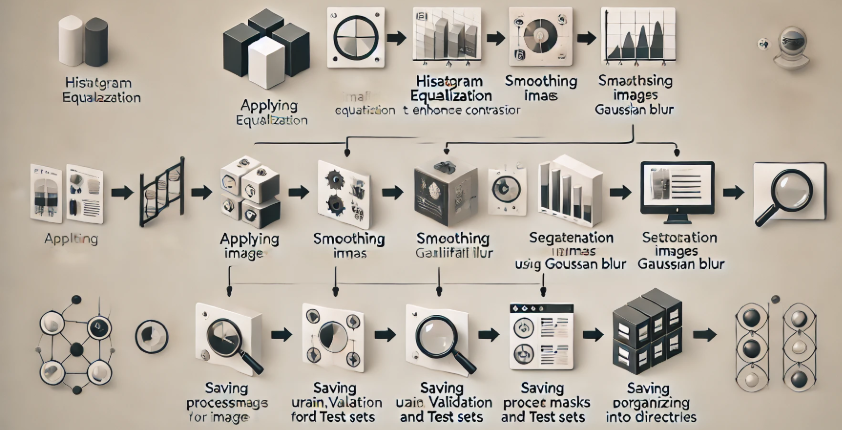
<font color='#EADCA0'><h2>Image Processing Pipeline:</h2></font>
###### <font color='#E1CD76'>
1.Applying Histogram Equalization to Enhance Image Contrast<br>
2.Smoothing Images Using Gaussian Blur<br>
3.Segmentation Using Otsu's Method for Mask Creation<br>
4.Saving Processed Masks for Train, Validation, and Test Sets<br>
5.Processing and Organizing Masked Images into Directories<br>
</font>

In [ ]:
train_dir = '/content/process/train'
val_dir = '/content/process/val'
test_dir = '/content/process/test'

processed_train_dir = '/content/proces/train'
processed_val_dir = '/content/proces/val'
processed_test_dir = '/content/proces/test'

class_names = [
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]

def apply_mask(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        print(f"Error loading image: {image_path}")
        return None

    equalized_image = cv2.equalizeHist(image)
    smoothed_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)
    _, segmented_image = cv2.threshold(smoothed_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return segmented_image

os.makedirs(processed_train_dir, exist_ok=True)
os.makedirs(processed_val_dir, exist_ok=True)
os.makedirs(processed_test_dir, exist_ok=True)

for class_name in class_names:
    class_train_dir = os.path.join(train_dir, class_name)
    class_val_dir = os.path.join(val_dir, class_name)
    class_test_dir = os.path.join(test_dir, class_name)
    processed_class_train_dir = os.path.join(processed_train_dir, class_name)
    processed_class_val_dir = os.path.join(processed_val_dir, class_name)
    processed_class_test_dir = os.path.join(processed_test_dir, class_name)

    os.makedirs(processed_class_train_dir, exist_ok=True)
    os.makedirs(processed_class_val_dir, exist_ok=True)
    os.makedirs(processed_class_test_dir, exist_ok=True)

    for img_name in os.listdir(class_train_dir):
        image_path = os.path.join(class_train_dir, img_name)
        mask = apply_mask(image_path)
        if mask is not None:
            mask_save_path = os.path.join(processed_class_train_dir, img_name)
            cv2.imwrite(mask_save_path, mask)
    for img_name in os.listdir(class_val_dir):
        image_path = os.path.join(class_val_dir, img_name)
        mask = apply_mask(image_path)
        if mask is not None:
            mask_save_path = os.path.join(processed_class_val_dir, img_name)
            cv2.imwrite(mask_save_path, mask)

    for img_name in os.listdir(class_test_dir):
        image_path = os.path.join(class_test_dir, img_name)
        mask = apply_mask(image_path)
        if mask is not None:
            mask_save_path = os.path.join(processed_class_test_dir, img_name)
            cv2.imwrite(mask_save_path, mask)

print("Mask processing applied and masks saved in the processed folders.")


Mask processing applied and masks saved in the processed folders.


<font color='#EADCA0'><h2>Display Images From Each Class</h2></font>


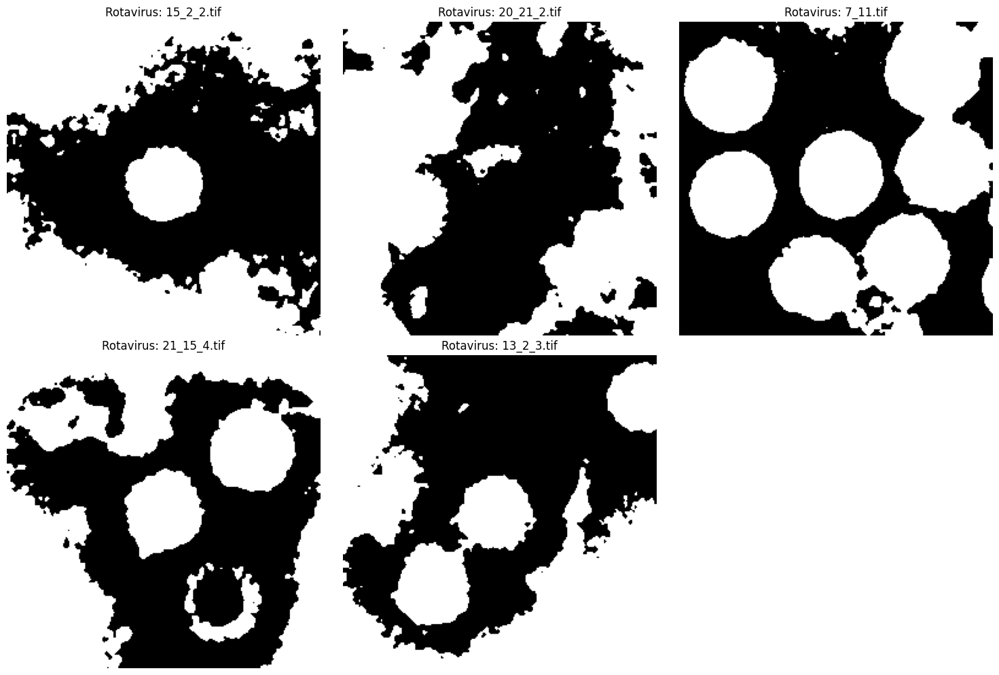

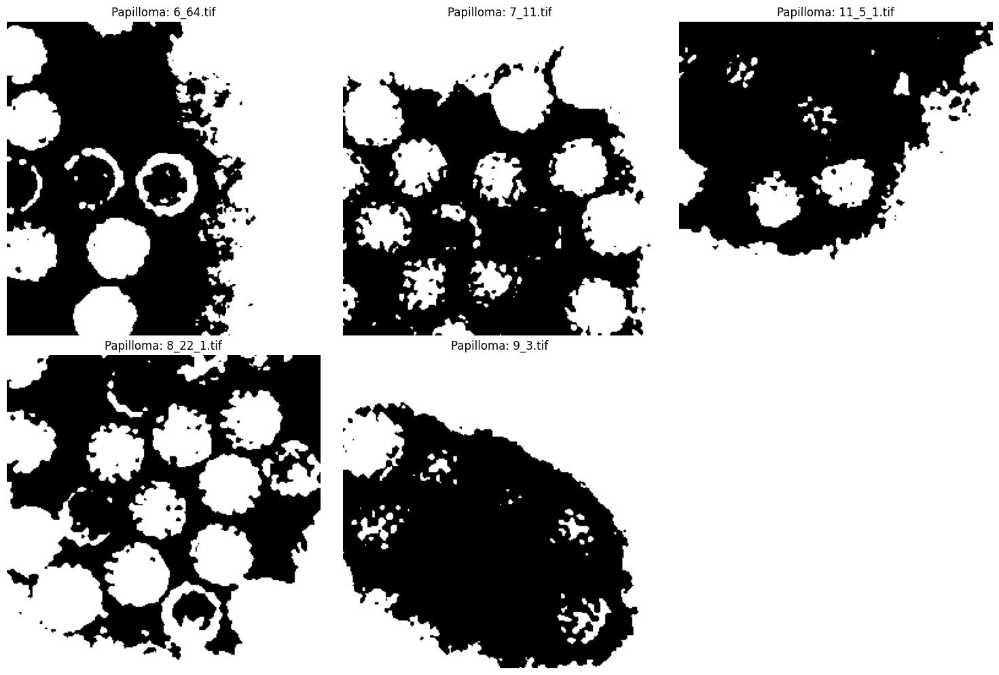

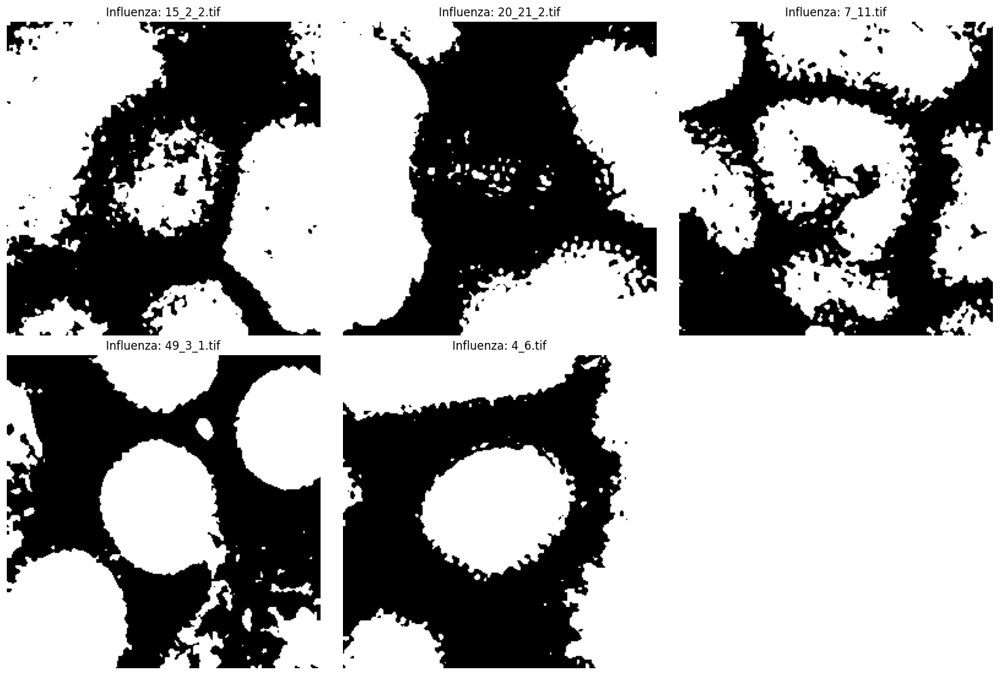

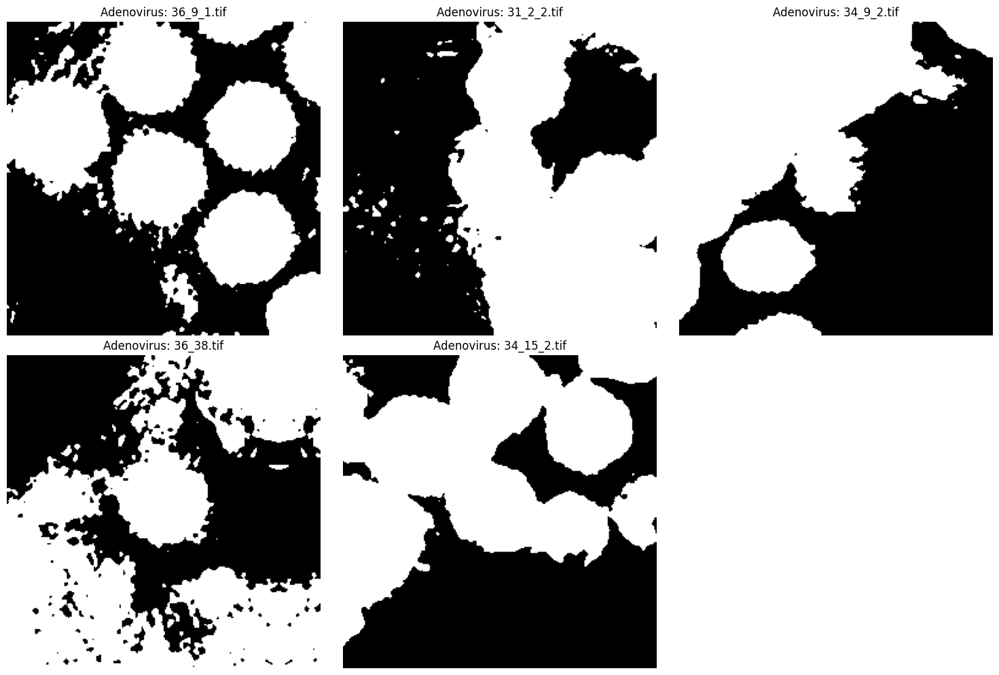

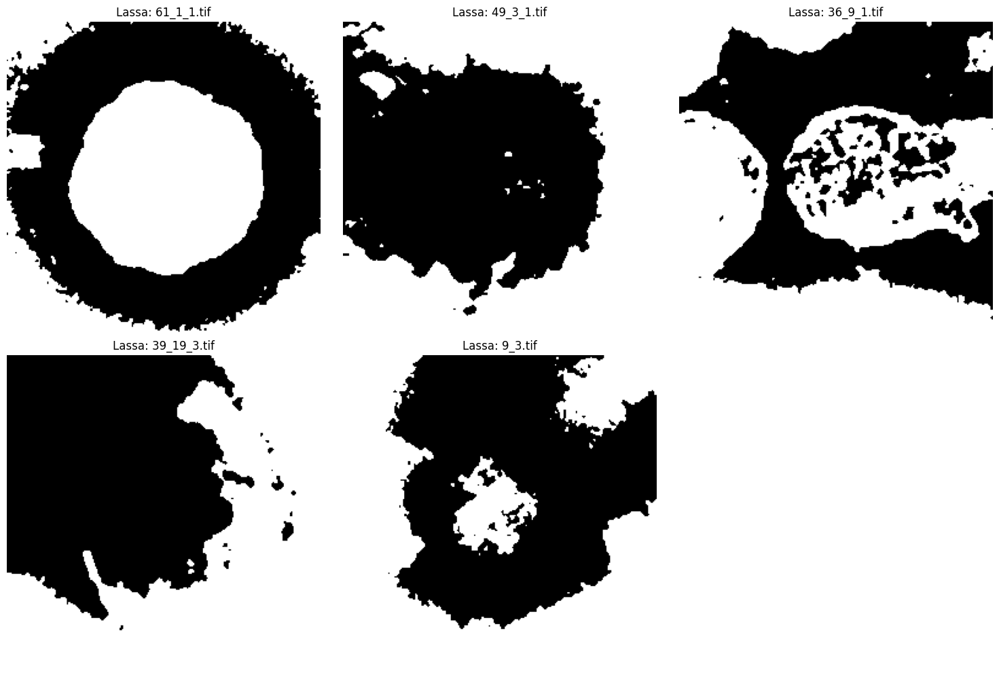

...

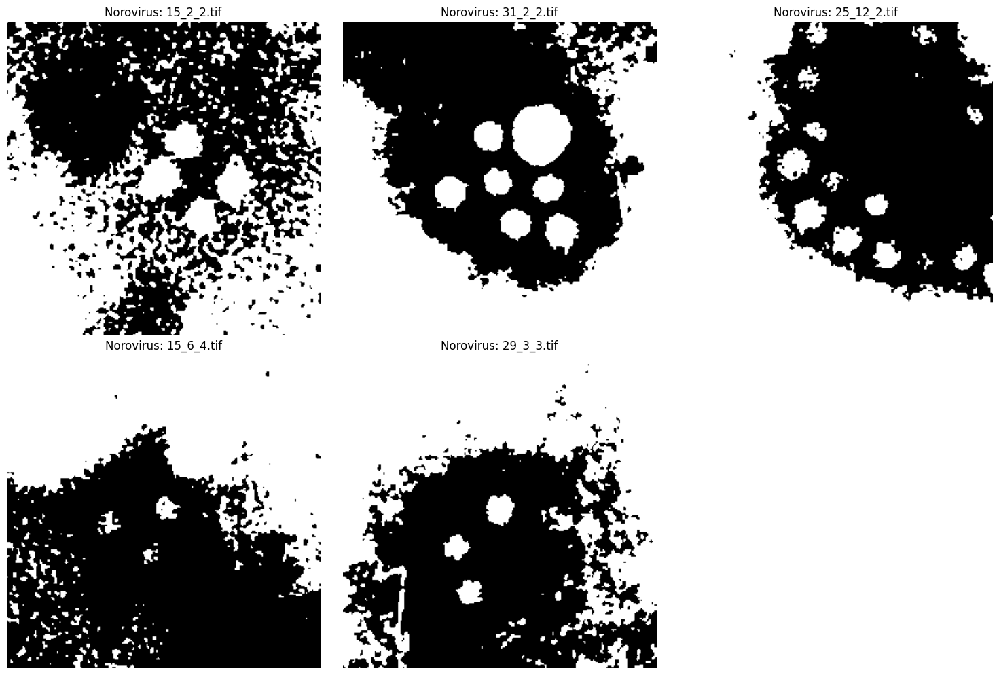

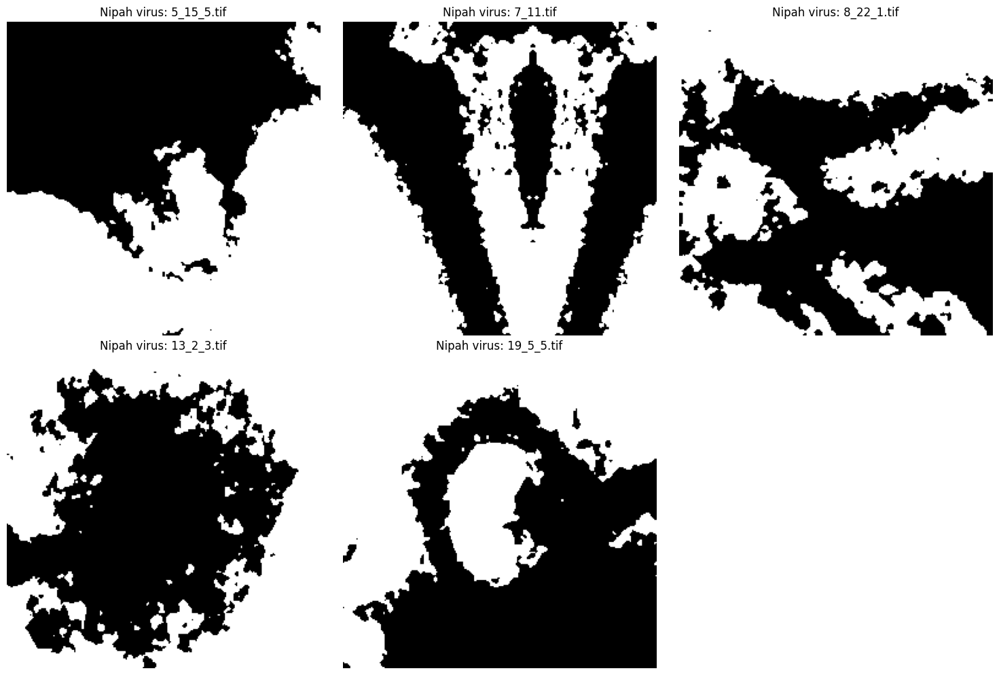

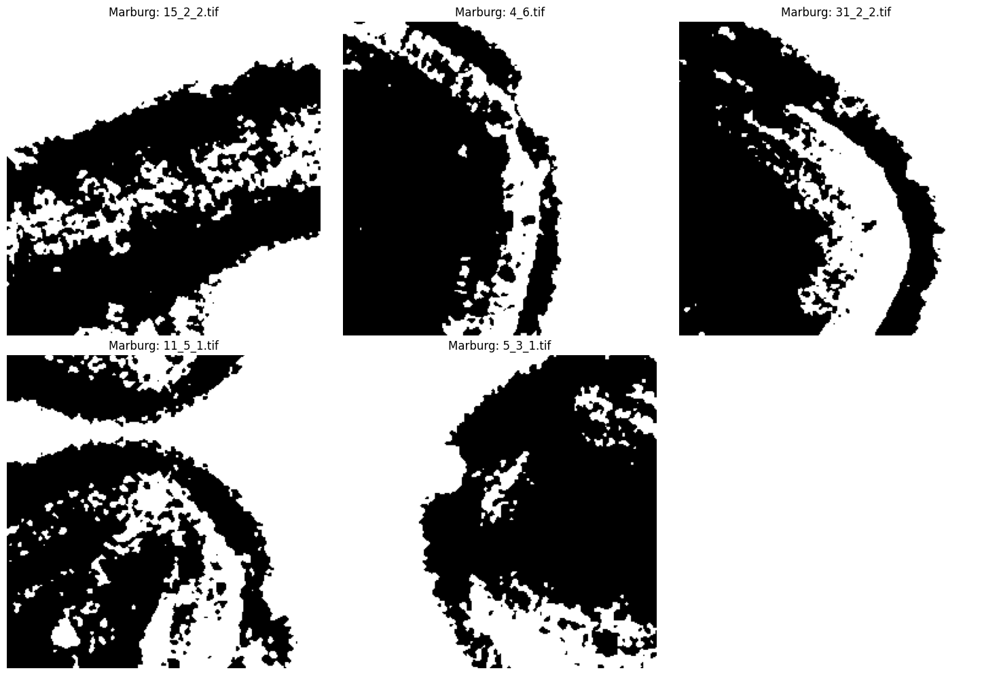

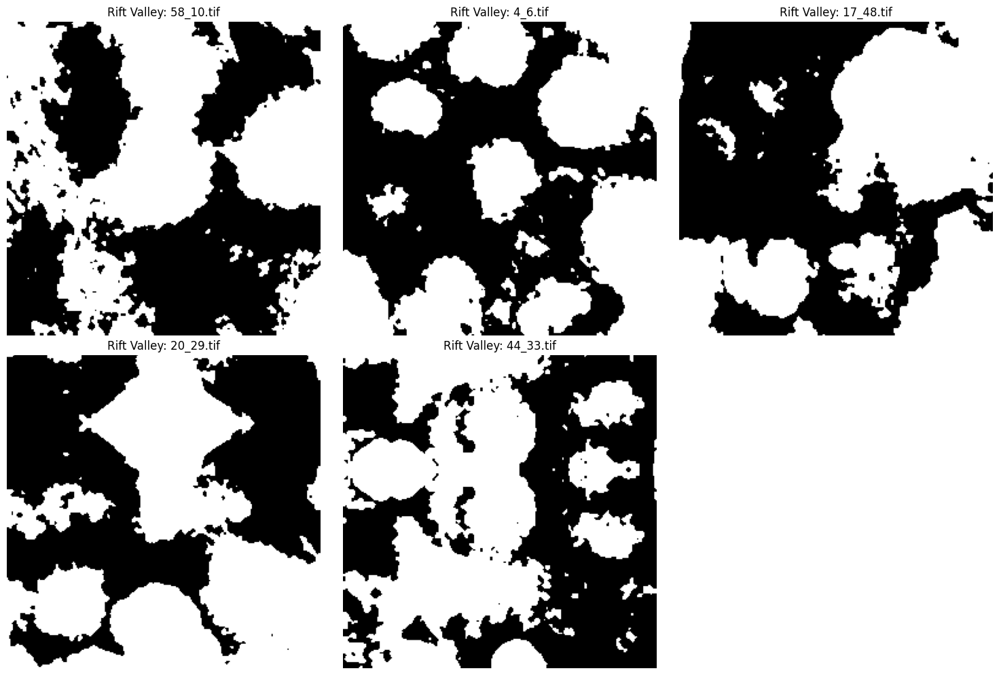

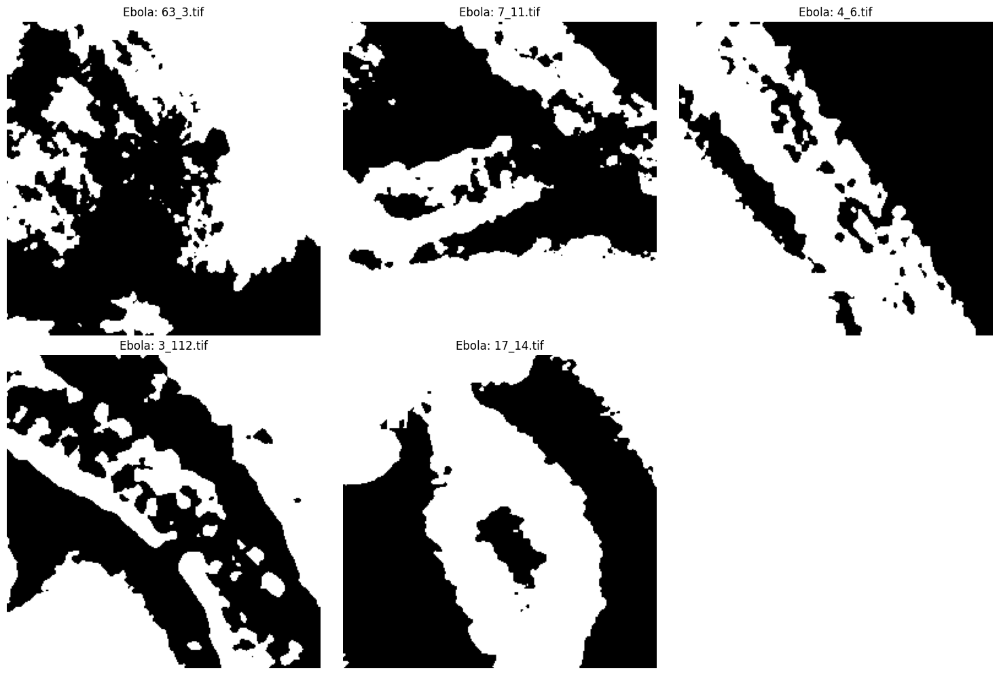

Image display completed.


In [ ]:
output_dir = '/content/proces/train'

class_names = [
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]

def display_images(class_name):
    class_output_dir = os.path.join(output_dir, class_name)
    images = os.listdir(class_output_dir)[:5]

    plt.figure(figsize=(15, 10))
    for i, img_name in enumerate(images):
        img_path = os.path.join(class_output_dir, img_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        plt.subplot(2, 3, i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{class_name}: {img_name}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

for class_name in class_names:
    display_images(class_name)

print("Image display completed.")


<font color='#EADCA0'><h2>Directory Setup for Image Data</h2></font>


In [ ]:
train_dir = "/content/process/train"
test_dir = "/content/process/test"
val_dir = "/content/process/val"

<font color='#EADCA0'><h2>Image Data Generators:</h2></font>
###### <font color='#E1CD76'>
used to preprocess and augment the image data
</font>

In [ ]:
train_gen = ImageDataGenerator( rescale= 1. / 255)
test_gen = ImageDataGenerator(rescale = 1. / 255)
val_gen = ImageDataGenerator(rescale = 1. / 255)

<font color='#EADCA0'><h2>Data Generators for Training, Testing, and Validation</h2></font>


In [ ]:
train_generator = train_gen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size = 128,
    class_mode='sparse'  # or 'categorical'
)
print(train_generator.class_indices)

Found 10326 images belonging to 14 classes.
{'Adenovirus': 0, 'Astrovirus': 1, 'CCHF': 2, 'Cowpox': 3, 'Ebola': 4, 'Influenza': 5, 'Lassa': 6, 'Marburg': 7, 'Nipah virus': 8, 'Norovirus': 9, 'Orf': 10, 'Papilloma': 11, 'Rift Valley': 12, 'Rotavirus': 13}


In [ ]:
test_generator = test_gen.flow_from_directory(
    test_dir,
    target_size = (224,224),
    batch_size = 128,
    class_mode = 'sparse'
)
print(test_generator.class_indices)

Found 3454 images belonging to 14 classes.
{'Adenovirus': 0, 'Astrovirus': 1, 'CCHF': 2, 'Cowpox': 3, 'Ebola': 4, 'Influenza': 5, 'Lassa': 6, 'Marburg': 7, 'Nipah virus': 8, 'Norovirus': 9, 'Orf': 10, 'Papilloma': 11, 'Rift Valley': 12, 'Rotavirus': 13}


In [ ]:
val_generator = val_gen.flow_from_directory(
    val_dir,
    target_size = (224,224),
    batch_size = 128,
    class_mode = 'sparse'
)
print(val_generator.class_indices)

Found 3437 images belonging to 14 classes.
{'Adenovirus': 0, 'Astrovirus': 1, 'CCHF': 2, 'Cowpox': 3, 'Ebola': 4, 'Influenza': 5, 'Lassa': 6, 'Marburg': 7, 'Nipah virus': 8, 'Norovirus': 9, 'Orf': 10, 'Papilloma': 11, 'Rift Valley': 12, 'Rotavirus': 13}


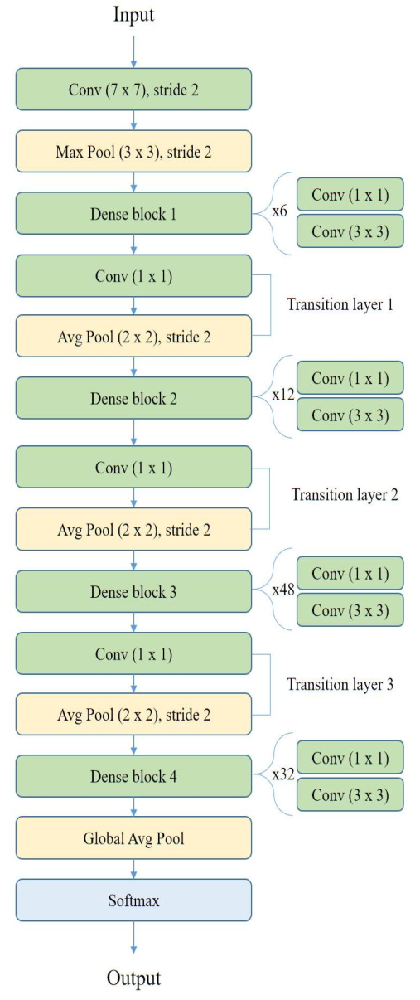
<font color='#EADCA0'><h2>Model Architecture Setup</h2></font>
###### <font color='#E1CD76'>
1.Base Model: The DenseNet201 model is loaded, pre-trained on ImageNet, excluding the top classification layers (include_top=False).</br>
2.Freezing Layers: Initially, all layers in the base model are frozen (layer.trainable = False) to prevent them from being trained.</br>
3.Fine-tuning: The last 10 layers are unfrozen and made trainable to allow for fine-tuning during training<br>
</font>
.


In [ ]:
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in base_model.layers:
    layer.trainable = False

for layer in base_model.layers[-10:]:
    layer.trainable = True


74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(128, activation='relu')(x)
predictions = layers.Dense(14, activation='softmax')(x)

<font color='#EADCA0'><h2>Compiling the Model</h2></font>


In [ ]:
model = models.Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


In [ ]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block2_0_bn    

 Total params: 19,471,566 (74.28 MB)

 Trainable params: 1,435,982 (5.48 MB)

 Non-trainable params: 18,035,584 (68.80 MB)

#<font color='#E1CD76'>Class Weights for Imbalanced Data</font>

In [ ]:
class_indices = train_generator.class_indices
class_labels = list(class_indices.keys())

train_labels = train_generator.classes

class_weights = compute_class_weight('balanced', classes=np.unique(train_labels), y=train_labels)
class_weights_dict = dict(enumerate(class_weights))

print("Class Labels:", class_labels)
print("Class Weights:", class_weights_dict)


<font color='#EADCA0'><h2>Callbacks for Training</h2></font>
###### <font color='#E1CD76'>
1.ModelCheckpoint: Saves the best model (based on validation loss) as Dense.keras.<br>
2.Save Weights Only: Saves only the model weights during training in Dense.weights.h5.<br>
3.EarlyStopping: Stops training if validation loss does not improve for 15 epochs and restores the best model weights.<br>
</font>

In [ ]:
checkpoint_full_model = ModelCheckpoint(
    filepath='Dense.keras',
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

checkpoint_weights_only = ModelCheckpoint(
    filepath='Dense.weights.h5',
    save_weights_only=True,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True, verbose=1)

Class Labels: ['Adenovirus', 'Astrovirus', 'CCHF', 'Cowpox', 'Ebola', 'Influenza', 'Lassa', 'Marburg', 'Nipah virus', 'Norovirus', 'Orf', 'Papilloma', 'Rift Valley', 'Rotavirus']
Class Weights: {0: 1.1954156054642278, 1: 1.0597290640394088, 2: 1.0783208020050126, 3: 1.2231698649609097, 4: 0.8353017311114707, 5: 0.8177066835603422, 6: 0.9704887218045113, 7: 0.8546598245323622, 8: 1.3054361567635904, 9: 1.075177009579342, 10: 1.2985412474849094, 11: 0.8017080745341615, 12: 0.7465297860034702, 13: 1.2480058013052937}


#<font color='#E1CD76'>Training the Model</font>

In [ ]:
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=120,
    callbacks=[checkpoint_full_model, checkpoint_weights_only, early_stopping],
    class_weight=class_weights_dict
)

Epoch 1/120


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.1349 - loss: 2.6451
Epoch 1: val_loss improved from inf to 2.09080, saving model to Dense.keras

Epoch 1: val_loss improved from inf to 2.09080, saving model to Dense.weights.h5
81/81 ━━━━━━━━━━━━━━━━━━━━ 240s 2s/step - accuracy: 0.1359 - loss: 2.6429 - val_accuracy: 0.5415 - val_loss: 2.0908
Epoch 2/120
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 534ms/step - accuracy: 0.4042 - loss: 1.9478
Epoch 2: val_loss improved from 2.09080 to 1.27722, saving model to Dense.keras

Epoch 2: val_loss improved from 2.09080 to 1.27722, saving model to Dense.weights.h5
81/81 ━━━━━━━━━━━━━━━━━━━━ 70s 829ms/step - accuracy: 0.4048 - loss: 1.9458 - val_accuracy: 0.6834 - val_loss: 1.2772
Epoch 3/120
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step - accuracy: 0.5685 - loss: 1.3859
Epoch 3: val_loss improved from 1.27722 to 0.85045, saving model to Dense.keras

Epoch 3: val_loss improved from 1.27722 to 0.85045, saving model to Dense.weights.h5
81/81 ━━━━━━━━━━━━━━━━━━━━ 77s

# <font color='#E1CD76'>Model Evaluation and Visualization</font>

##<font color='#E1CD76'>1. Model Evaluation</font>

In [ ]:
train_result = model.evaluate(train_generator)
test_result = model.evaluate(test_generator)
val_result = model.evaluate (val_generator)

81/81 ━━━━━━━━━━━━━━━━━━━━ 65s 801ms/step - accuracy: 0.9765 - loss: 0.0653


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


27/27 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.9522 - loss: 0.2039
27/27 ━━━━━━━━━━━━━━━━━━━━ 13s 465ms/step - accuracy: 0.9487 - loss: 0.1984


In [ ]:
print('Train loss:', (np.round(train_result[0], 4)))
print('Test loss:', (np.round(test_result[0], 4)))
print('Val loss:', (np.round(val_result[0], 4)))

print('Train accuracy:', (np.round(train_result[1], 4) * 100) , '%')
print('Test accuracy:', (np.round(test_result[1], 4) * 100) , '%')
print('Val accuracy:', (np.round(val_result[1], 4) * 100) , '%')


Train loss: 0.0623
Test loss: 0.1997
Val loss: 0.181
Train accuracy: 97.74000000000001 %
Test accuracy: 94.88 %
Val accuracy: 94.88 %


##<font color='#E1CD76'>2. Learning Curve Plotting</font>



In [ ]:
def plot_learning_curve(history, metrics):
    acc = history.history[metrics]
    val_acc = history.history[f'val_{metrics}']
    epochs = range(len(acc))

    plt.figure(figsize=(8,5))
    plt.plot(epochs, acc, label=f'training_{metrics}')
    plt.plot(epochs, val_acc, label=f'val_{metrics}')
    plt.scatter(epochs, acc, color='blue')
    plt.scatter(epochs, val_acc, color='blue')
    plt.grid(True, color='gray')
    plt.legend()
    plt.show()

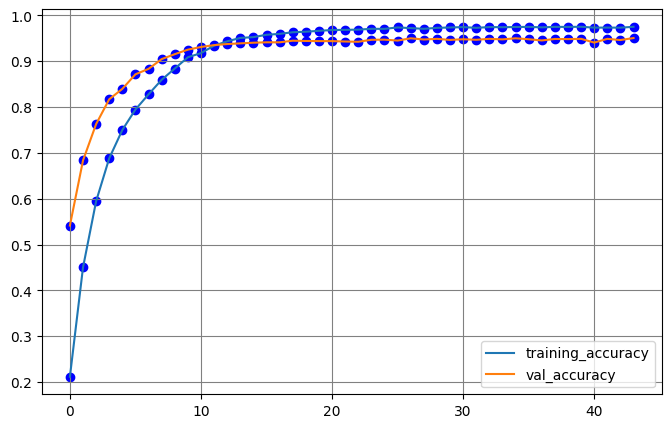

In [ ]:
plot_learning_curve(history=history, metrics='accuracy')

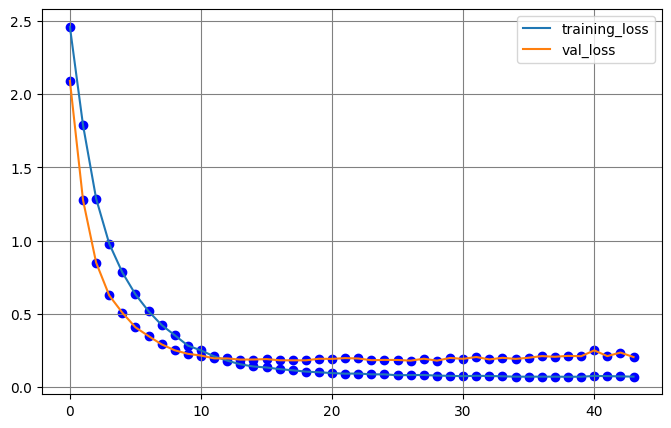

In [ ]:
plot_learning_curve(history=history, metrics='loss')

##<font color='#E1CD76'>3. Classification Report & Confusion Matrix</font>



4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━

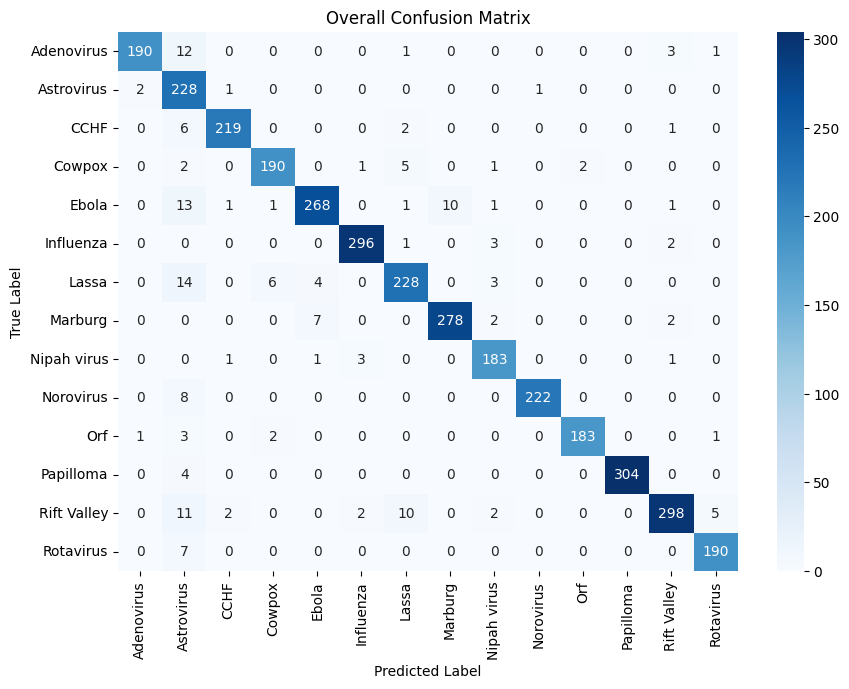

In [ ]:
test_predicts = []
test_targets = []

for batch_index, (x_test, y_test) in enumerate(test_generator):
    if batch_index >= len(test_generator):
        break
    test_predict = model.predict(x_test)
    batch_predicts = test_predict.argmax(axis=1)
    batch_targets = y_test
    test_predicts.append(batch_predicts)
    test_targets.append(batch_targets)

test_predicts = np.concatenate(test_predicts)
test_targets = np.concatenate(test_targets)


print("Overall Classification Report:")
print(classification_report(test_targets, test_predicts))


overall_cm = confusion_matrix(test_targets, test_predicts)
print("Overall Confusion Matrix:")
print(overall_cm)
class_names = list(test_generator.class_indices.keys())


plt.figure(figsize=(10, 7))
sns.heatmap(overall_cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names ,
            yticklabels=class_names )
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Overall Confusion Matrix')
plt.show()

##<font color='#E1CD76'>4. ROC Curve Visualization</font>



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 

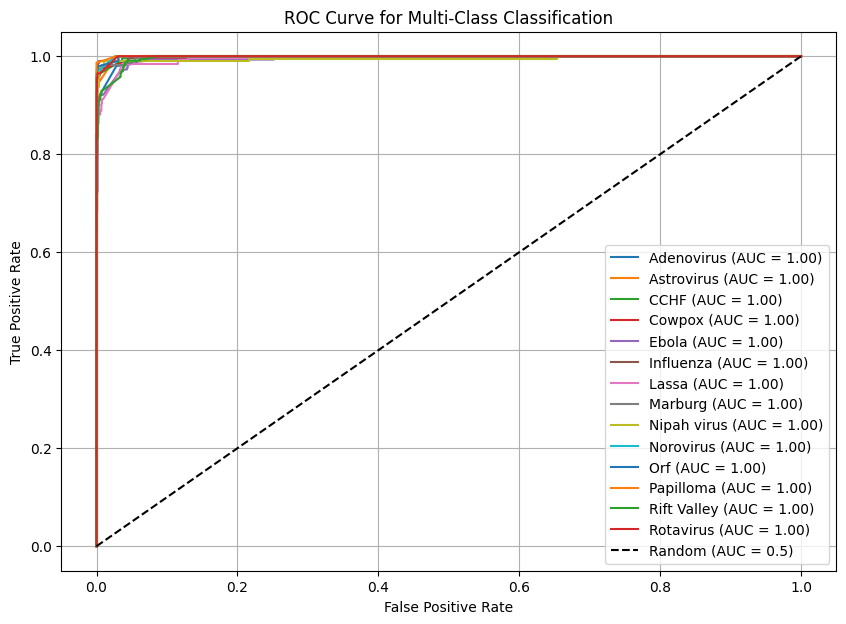

In [ ]:
test_predicts_proba = []
test_targets = []

for batch_index, (x_test, y_test) in enumerate(test_generator):
    if batch_index >= len(test_generator):
        break
    test_predict_proba = model.predict(x_test)
    batch_targets = y_test
    test_predicts_proba.append(test_predict_proba)
    test_targets.append(batch_targets)

test_predicts_proba = np.concatenate(test_predicts_proba)
test_targets = np.concatenate(test_targets)

# Binarize the true labels --------------->>one-hot encoding for multi-class
lb = LabelBinarizer()
test_targets_binarized = lb.fit_transform(test_targets)

plt.figure(figsize=(10, 7))

class_names = list(test_generator.class_indices.keys())

for i in range(len(class_names)):
    fpr, tpr, _ = roc_curve(test_targets_binarized[:, i], test_predicts_proba[:, i])
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f'{class_names[i]} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random (AUC = 0.5)')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multi-Class Classification')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


In [ ]:
model.save('Virus-Dense.h5')

##<font color='#E1CD76'>5. Grad-CAM Visualization</font>



##<font color='#E1CD76'>
 This function preprocesses the image to match the model input requirements before</br>
 feeding it into the model for predictions and Grad-CAM generation.</font>
 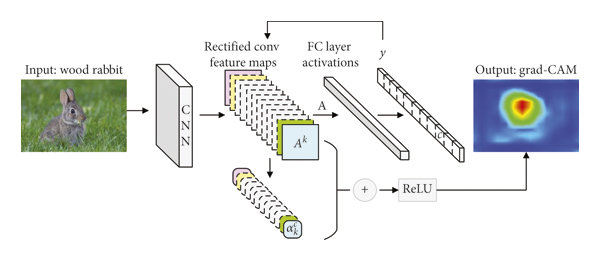

In [ ]:
# Load model
model = tf.keras.models.load_model('/content/Virus-Dense.h5')

# Identify the last convolutional layer
last_conv_layer = model.get_layer('conv5_block32_2_conv')

grad_model = Model(inputs=model.inputs,
                   outputs=[last_conv_layer.output, model.output])


###<font color='#E1CD76'>Preprocess Image for Grad-CAM</font>



In [ ]:
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    return img_array
test_images_dir = '/content/process/test'
results = []

###<font color='#E1CD76'>Generate Grad-CAM Heatmap</font>
######<font color='#E1CD76'>
This function generates the Grad-CAM heatmap based on the activations of the last</br>
convolutional layer and the predicted class for the given image.</br></font>

In [ ]:
def generate_grad_cam(model, img_array, predicted_class):
    last_conv_layer = model.get_layer('conv5_block32_concat')

    grad_model = tf.keras.models.Model(inputs=model.input, outputs=[last_conv_layer.output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)

        if isinstance(predictions, list):
            predictions = predictions[0]

        print(f"Predictions shape: {predictions.shape}")

        if predicted_class < predictions.shape[1]:
            loss = predictions[0, predicted_class]
        else:
            raise ValueError(f"predicted_class {predicted_class} is out of bounds for predictions shape {predictions.shape}.")

    grads = tape.gradient(loss, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1))
    heatmap = conv_outputs[0] @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = heatmap.numpy()

    if np.max(heatmap) != 0:
        heatmap /= np.max(heatmap)

    print(f"Generated heatmap shape: {heatmap.shape}")

    return heatmap

###<font color='#E1CD76'> Generate Grad-CAM Results for Multiple Images</font>
######<font color='#E1CD76'>
This function generates Grad-CAM results for a sample of images in the given test image directory.</br>
It applies preprocessing, predictions, and heatmap generation, then stores the results for later display.</br></font>

1/1 ━━━━━━━━━━━━━━━━━━━━ 17s 17s/step
Predictions shape: (1, 14)
Generated heatmap shape: (7, 7)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (7, 7)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (7, 7)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (7, 7)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (7, 7)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (7, 7)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (7, 7)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (7, 7)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (7, 7)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (7, 7)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33

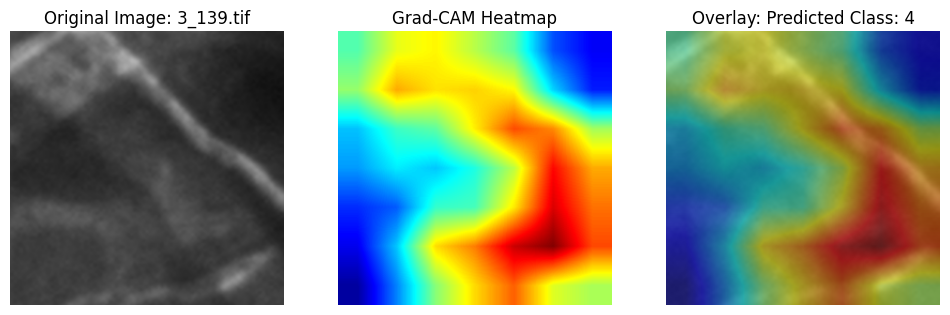

Image: 3_139.tif, Predicted Class: 4, Link: /content/process/test/Ebola/3_139.tif


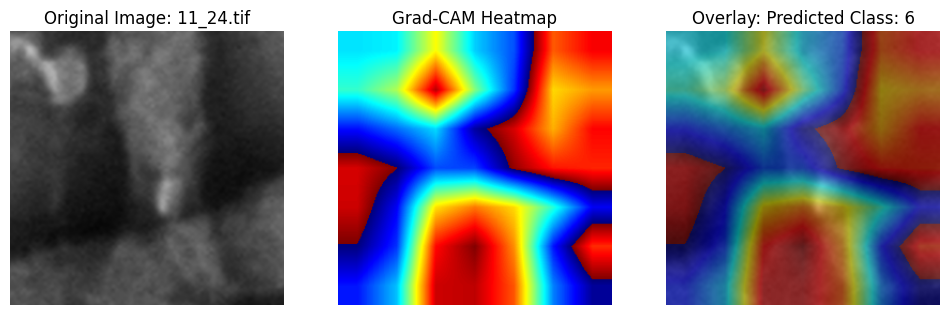

Image: 11_24.tif, Predicted Class: 6, Link: /content/process/test/Lassa/11_24.tif


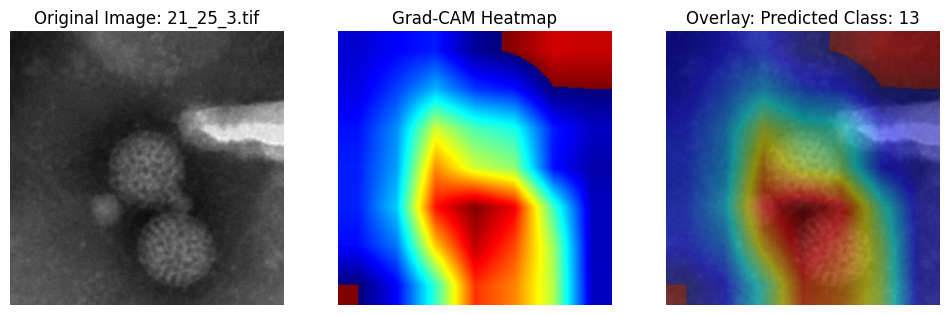

Image: 21_25_3.tif, Predicted Class: 13, Link: /content/process/test/Rotavirus/21_25_3.tif


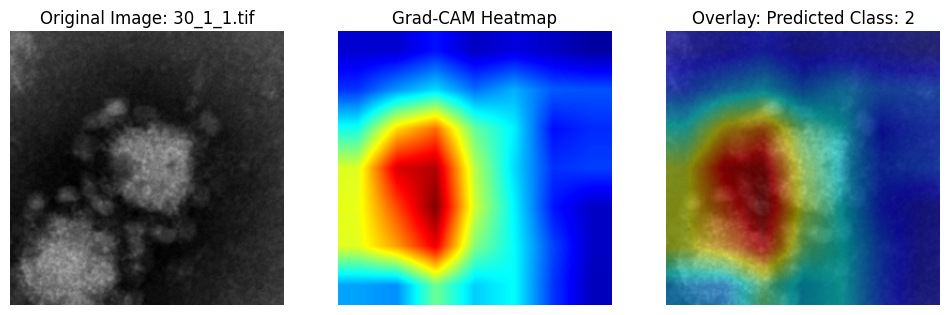

Image: 30_1_1.tif, Predicted Class: 2, Link: /content/process/test/CCHF/30_1_1.tif


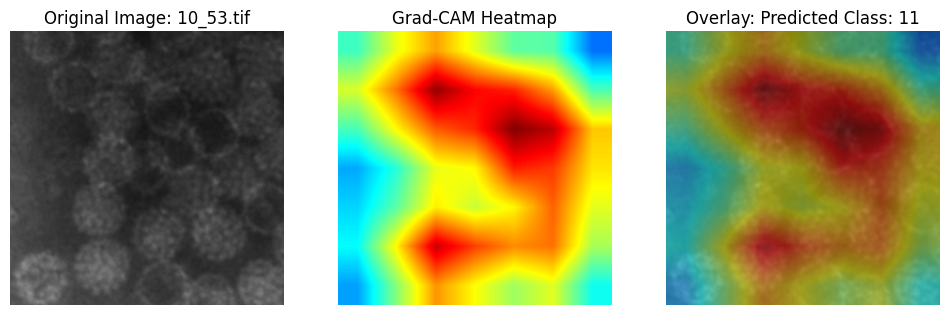

Image: 10_53.tif, Predicted Class: 11, Link: /content/process/test/Papilloma/10_53.tif


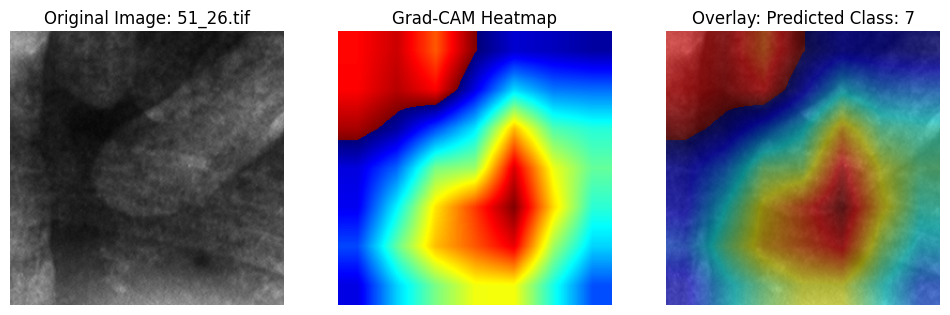

Image: 51_26.tif, Predicted Class: 7, Link: /content/process/test/Marburg/51_26.tif


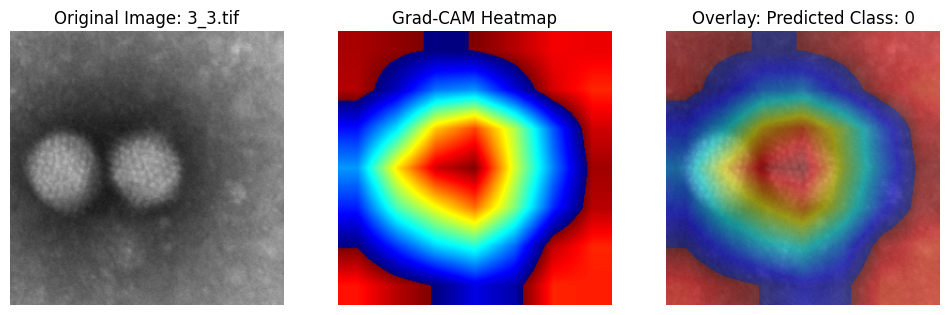

Image: 3_3.tif, Predicted Class: 0, Link: /content/process/test/Adenovirus/3_3.tif


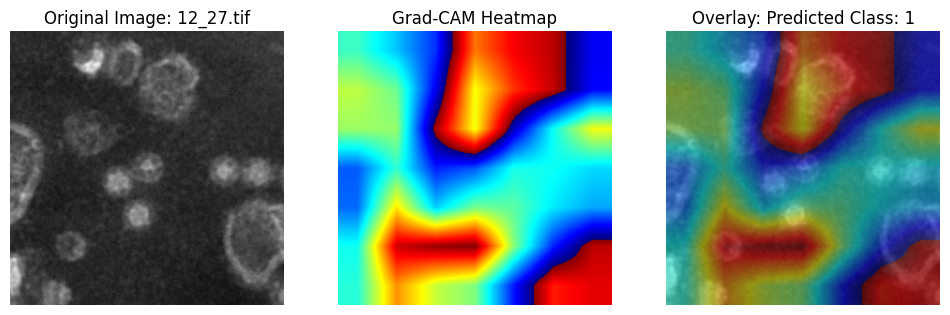

Image: 12_27.tif, Predicted Class: 1, Link: /content/process/test/Astrovirus/12_27.tif


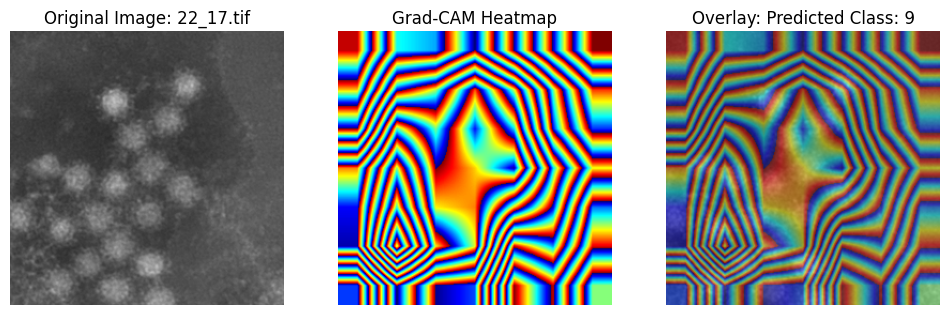

Image: 22_17.tif, Predicted Class: 9, Link: /content/process/test/Norovirus/22_17.tif


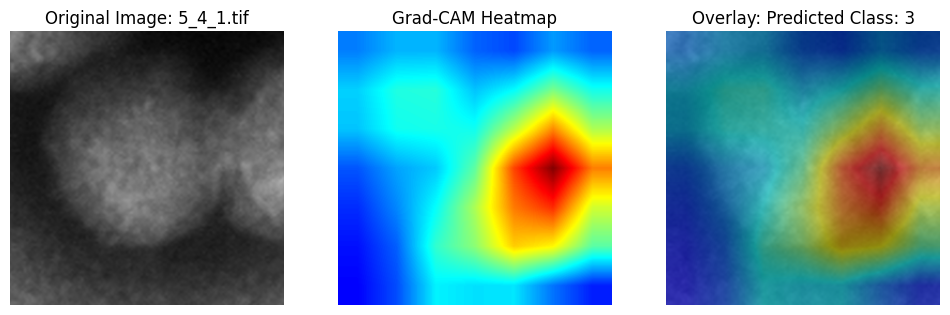

Image: 5_4_1.tif, Predicted Class: 3, Link: /content/process/test/Cowpox/5_4_1.tif


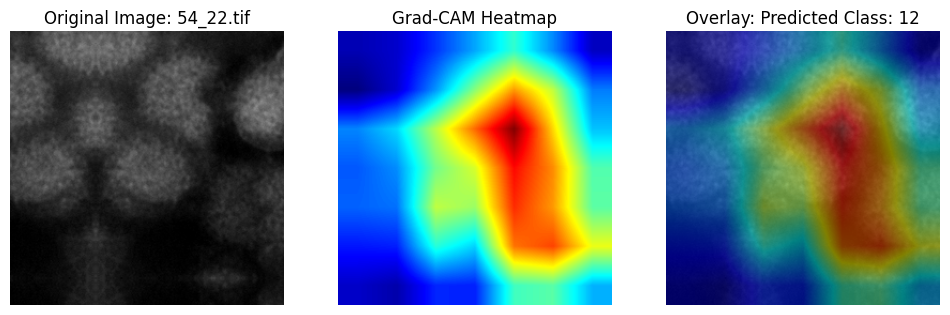

Image: 54_22.tif, Predicted Class: 12, Link: /content/process/test/Rift Valley/54_22.tif


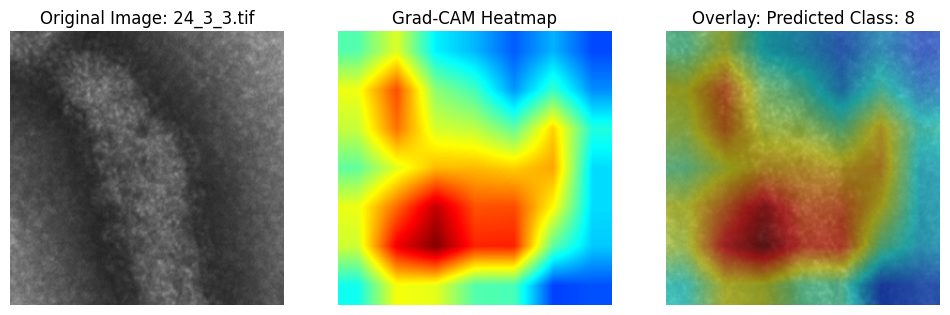

Image: 24_3_3.tif, Predicted Class: 8, Link: /content/process/test/Nipah virus/24_3_3.tif


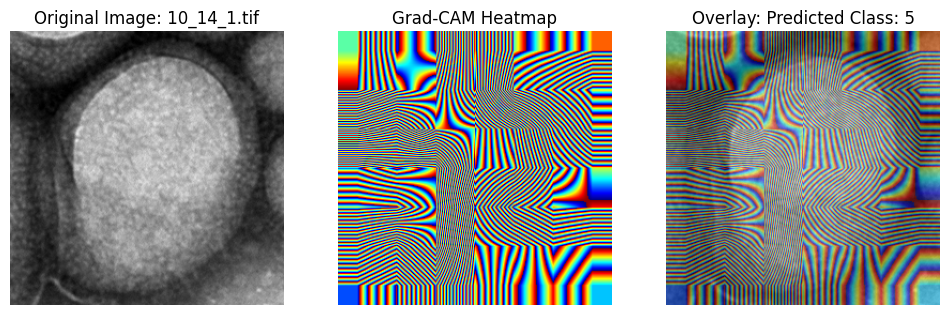

Image: 10_14_1.tif, Predicted Class: 5, Link: /content/process/test/Influenza/10_14_1.tif


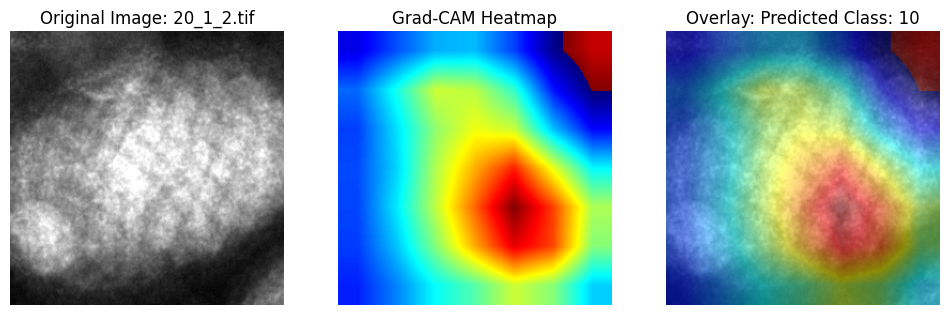

Image: 20_1_2.tif, Predicted Class: 10, Link: /content/process/test/Orf/20_1_2.tif


In [ ]:
test_images_dir = '/content/process/test'

class_dirs = [d for d in os.listdir(test_images_dir) if os.path.isdir(os.path.join(test_images_dir, d))]

sample_size = 1
results = []

for class_dir in class_dirs:
    class_path = os.path.join(test_images_dir, class_dir)

    image_files = [f for f in os.listdir(class_path) if f.endswith('.tif')]
    sampled_files = random.sample(image_files, min(sample_size, len(image_files)))

    for filename in sampled_files:
        image_path = os.path.join(class_path, filename)
        img_array = preprocess_image(image_path)

        predictions = model.predict(img_array)
        predicted_class = np.argmax(predictions[0])

        heatmap = generate_grad_cam(model, img_array, predicted_class)

        original_image = load_img(image_path)

        if isinstance(heatmap, np.ndarray):
            heatmap_resized = cv2.resize(heatmap, (original_image.size[0], original_image.size[1]))
            heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)

            heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)
        else:
            raise ValueError(f"Heatmap is not a valid numpy array: {type(heatmap)}")

        original_image_np = img_to_array(original_image) / 255.0
        heatmap_color_float = heatmap_color.astype(np.float32) / 255.0

        overlayed_image = cv2.addWeighted(heatmap_color_float, 0.5, original_image_np, 0.5, 0)

        results.append((filename, predicted_class, image_path, original_image, overlayed_image, heatmap_color))

for filename, predicted_class, image_link, original_image, overlayed_image, heatmap_color in results:
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title(f'Original Image: {filename}')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap_color)
    plt.title('Grad-CAM Heatmap')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(overlayed_image)
    plt.title(f'Overlay: Predicted Class: {predicted_class}')
    plt.axis('off')

    plt.show()

    print(f'Image: {filename}, Predicted Class: {predicted_class}, Link: {image_link}')
